In [164]:
from openeye.oechem import *
from openeye.oedepict import *
import oenotebook as oenb
from IPython.display import display
import os
import pandas as pd
smile = "ccccc"
file = "./Mol500.ism"

In [165]:
def MainHighlightFunction(file, smile):
    #Checking user input
    if not smile:
        print("Please type in query in smile format")
        return
    ifs = oemolistream()
    if not ifs.open(file):
        print("Cannot open target input file!")
        return
    qmol = OEGraphMol()
    OEParseSmiles(qmol, smile)
    print("The query molecule:")
    display(oenb.draw_mol(qmol))
    ss = OESubSearch(smile)
    #Creating an index file
    index = CreateMolDatabaseIndexFile(file)
    #Establishing data frame
    df = oenb.read_file_to_dataframe(file)
    total_len = len(df)
    #Applying function to determine substructure match
    df["SubStructure_Matches"] = df.Molecule.apply(ss.SingleMatch)
    #Sorting using the boolean output
    matches = df[df["SubStructure_Matches"] == True]
    matched = len(matches)
    print("The number of matched molecules is: {:d}".format(matched))
    print("The number of nonmatched molecules is: {:d}".format(total_len - matched))
    #Displaying the matches
    oenb.render_dataframe(matches, render_func=lambda x, width, height:  Highlight_substructure(x, smile, width, height))

def CreateMolDatabaseIndexFile(file):
    idxfname = OEGetMolDatabaseIdxFileName(file)
    if os.path.exists(idxfname):
        OEThrow.Warning("%s index file already exists" % idxfname)
    elif not OECreateMolDatabaseIdx(file):
        OEThrow.Warning("Unable to create " + str(idxfname) + "molecule index file")
    return idxfname

def Highlight_substructure(mol, smile, width = 400.0, height = 400.0):
    opts = OE2DMolDisplayOptions(width, height, OEScale_AutoScale)
    image = OEImage(width, height)
    colors = OEGetContrastColors()
    highlight = OEHighlightOverlayByBallAndStick(colors)
    borderpen = OEPen(OEWhite, OELightGrey, OEFill_Off, 1.0)
    ss = OESubSearch(smile)
    OEPrepareDepiction(mol)
    disp = OE2DMolDisplay(mol, opts)
    OEAddHighlightOverlay(disp, highlight, ss.Match(mol, True))
    OERenderMolecule(image, disp)
    OEDrawBorder(image, borderpen)
    display(oenb.draw_oeimage(image))
   

The query molecule:


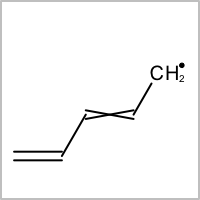

The number of matched molecules is: 466
The number of nonmatched molecules is: 34


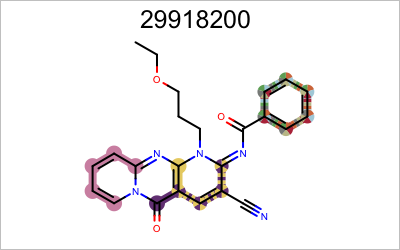

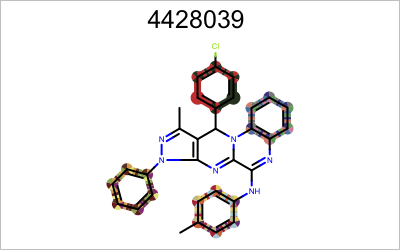

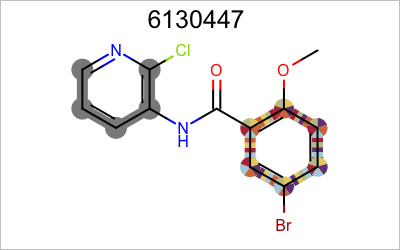

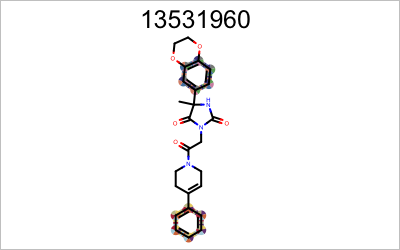

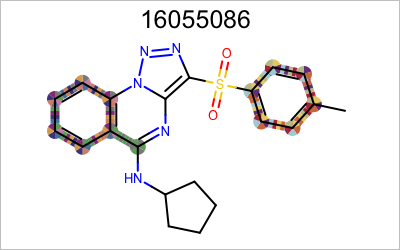

...

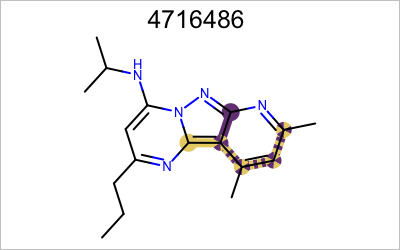

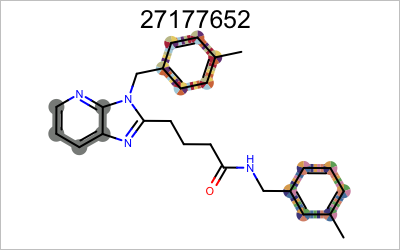

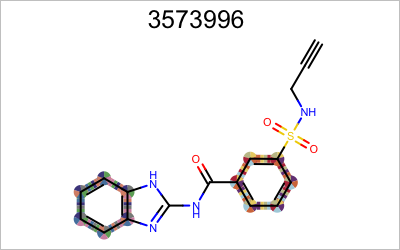

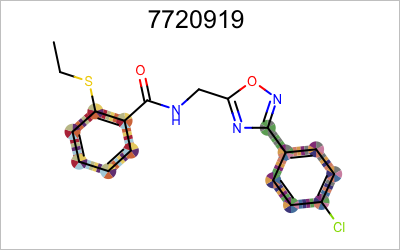

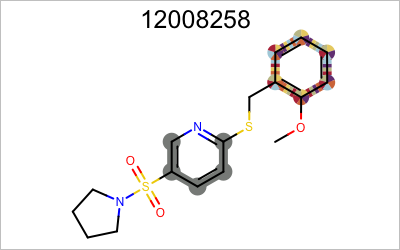

In [166]:
MainHighlightFunction(file, smile)